## Analyses of NSCLC data:
	T cells from NSCLC patients were sorted, profiled by Smart-seq2 and sequenced on Illumina HiSeq2500/HiSeq4000. Based on FACS analysis, single cells of different subtypes, including CD8+ T cells (CD3+ and CD8+), T helper cells (CD3+, CD4+ and CD25-), and regulatory T cells (CD3+, CD4+ and CD25high) were sorted to perform RNA sequencing. The categories （"sampleType" column in the SAMPLES section） contain PTC(CD8+ T cells from peripheral blood), NTC(CD8+ T cells from adjacent normal lung tissues) ,TTC (CD8+ T cells from tumor), PTH(CD3+, CD4+ and CD25- T cells from peripheral blood), NTH(CD3+, CD4+ and CD25- T cells from adjacent normal lung tissues), TTH(CD3+, CD4+ and CD25- T cells from tumor), PTR(CD3+, CD4+ and CD25high T cells from peripheral blood), NTR(CD3+, CD4+ and CD25high T cells from adjacent normal lung tissues), TTR(CD3+, CD4+ and CD25high T cells from tumor), PTY(CD3+, CD4+ and CD25mediate T cells from peripheral blood), NTY(CD3+, CD4+ and CD25mediate T cells from adjacent normal lung tissues), TTY(CD3+, CD4+ and CD25medate T cells from tumor). Raw data access provided at: European Genome-phenome Archive (EGA) under accession EGAS00001002430

In [8]:
import numpy as np
import scanpy as sc
import anndata as ad
import scipy.io
import gzip
# Data retrieval
import pooch
import pandas as pd
import os
import scipy.sparse as sp
from anndata import AnnData
import matplotlib as mpl
from matplotlib import pyplot as plt
from matplotlib.pyplot import rc_context
import seaborn as sns
from scipy.stats import gaussian_kde
from scipy.stats import ttest_ind
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.stats.multitest import multipletests

In [9]:
import pandas as pd
import re
from io import StringIO

# Load the .soft file
metadata_file = "/labs/delitto/peter/T_cell_atlases/NSCLC_T_cell/data/GSE99254-tbl-1.txt"
metadata_df = pd.read_csv(metadata_file, sep="\t", index_col=0, header =None)

metadata_df.columns = ["Patient", "Meta_Cluster", "Loc"]

# Save the updated file
metadata_df.to_csv("/labs/delitto/peter/T_cell_atlases/NSCLC_T_cell/data/metadata_with_columns.tsv", sep="\t", index=False)

# Show the first few rows
print(metadata_df.head())
from IPython.display import display
# Display the dataframe in Jupyter Notebook
display(metadata_df)


            Patient Meta_Cluster  Loc
0                                    
NTH-86-0617   P0617  CD4_C1-CCR7  NTH
NTH69-0619    P0619  CD4_C1-CCR7  NTH
NTH19-0913    P0913  CD4_C1-CCR7  NTH
NTH21-0913    P0913  CD4_C1-CCR7  NTH
NTH25-0913    P0913  CD4_C1-CCR7  NTH


,Patient,Meta_Cluster,Loc
0,,,
NTH-86-0617,P0617,CD4_C1-CCR7,NTH
NTH69-0619,P0619,CD4_C1-CCR7,NTH
NTH19-0913,P0913,CD4_C1-CCR7,NTH
NTH21-0913,P0913,CD4_C1-CCR7,NTH
NTH25-0913,P0913,CD4_C1-CCR7,NTH
...,...,...,...
TTC65-0617,P0617,other.MAIT,TTC
TTC139-1011,P1011,other.MAIT,TTC
TTC179-20171120,P1120,other.MAIT,TTC


In [133]:
# Define the directory where figures will be saved
fig_dir = "/home/pyxie/Single_cell_pan_tcell_analysis/figures"
os.makedirs(fig_dir, exist_ok=True)  # Create folder if it doesn't exist
# Define the directory where figures will be saved
output_dir = "/home/pyxie/Single_cell_pan_tcell_analysis/figures"
os.makedirs(output_dir, exist_ok=True)  # Create folder if it doesn't exist

sc.settings.set_figure_params(dpi_save=300, dpi=600)
sc.settings.figdir = fig_dir

## Load All datasets

In [10]:
# setup
path = 'data/'
figpath = 'figures/'

# lets set the default figure settings
sc.settings.set_figure_params(dpi_save=300, dpi=100)
sc.settings.figdir = figpath

# t_cell_integrated_path = "data/GSE99254_NSCLC.TCell.S11769.norm.centered.txt"
t_cell_integrated_path = "/labs/delitto/peter/T_cell_atlases/NSCLC_T_cell/data/GSE99254_NSCLC.TCell.S12346.count.txt"


# Read as a pandas DataFrame
tcelldf = pd.read_csv(t_cell_integrated_path, sep="\t", index_col=0)  # Assuming first column is genes
# tcelldf = pd.read_csv(t_cell_integrated_path, sep="\t", index_col=0)  # Assuming first column is genes

# Display first few rows
print(tcelldf.head())
#print(tcelldf2.head())
gene_symbols = tcelldf["symbol"].values


       symbol  NTH10-0616A  NTH11-0616A  NTH15-0616A  NTH17-0616A  NTH2-0616A  \
geneID                                                                          
1        A1BG            0            0            0            0           0   
10       NAT2            0            0            0            0           0   
100       ADA          223          519            0            0           0   
1000     CDH2            0            0            0            0           0   
10000    AKT3           57            0            0            0           0   

        NTH4-0616A  NTR15-0616A  NTR16-0616A  NTR17-0616A  ...  \
geneID                                                     ...   
1                0            0            0            0  ...   
10               0            0            0            0  ...   
100            120          511            0            0  ...   
1000             0            0            0            0  ...   
10000            0            0     

In [11]:
print(gene_symbols)

['A1BG' 'NAT2' 'ADA' ... 'DGCR2' 'CASP8AP2' 'SCO2']


In [12]:
print(tcelldf.index)
tcelldf = tcelldf.reset_index()  # Move index back to a column
print(tcelldf.columns)  # Check if 'geneSymbol' appears now

print(tcelldf.info())  # Check data types and null values
# print(tcelldf.head())  # Confirm structure
#tcelldf[:,1:12317].sum(axis=0)


Index([        1,        10,       100,      1000,     10000, 100008586,
       100009676,     10001,     10002,     10003,
       ...
            9987,      9988,      9989,       999,      9990,      9991,
            9992,      9993,      9994,      9997],
      dtype='int64', name='geneID', length=23459)
Index(['geneID', 'symbol', 'NTH10-0616A', 'NTH11-0616A', 'NTH15-0616A',
       'NTH17-0616A', 'NTH2-0616A', 'NTH4-0616A', 'NTR15-0616A', 'NTR16-0616A',
       ...
       'TTY52-20171219', 'TTY54-20171219', 'TTY59-20171219', 'TTY60-20171219',
       'TTY6-20171219', 'TTY63-20171219', 'TTY65-20171219', 'TTY7-20171219',
       'TTY8-20171219', 'TTY9-20171219'],
      dtype='object', length=12348)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23459 entries, 0 to 23458
Columns: 12348 entries, geneID to TTY9-20171219
dtypes: int64(12347), object(1)
memory usage: 2.2+ GB
None


In [13]:
# Sum expression counts across all genes for each sample
sample_sums = tcelldf.iloc[:, 2:].sum(axis=0)  # Skip 'symbol' column
# print(tcelldf.head())  # Confirm structure
# print(tcelldf.index)  # Print all column names to check
# Extract gene symbols as a NumPy array
  

# Check the output
print(sample_sums)


NTH10-0616A       721847
NTH11-0616A       833356
NTH15-0616A       853026
NTH17-0616A       920891
NTH2-0616A        722891
                   ...  
TTY63-20171219    944910
TTY65-20171219    612597
TTY7-20171219     439701
TTY8-20171219     654381
TTY9-20171219     522067
Length: 12346, dtype: int64


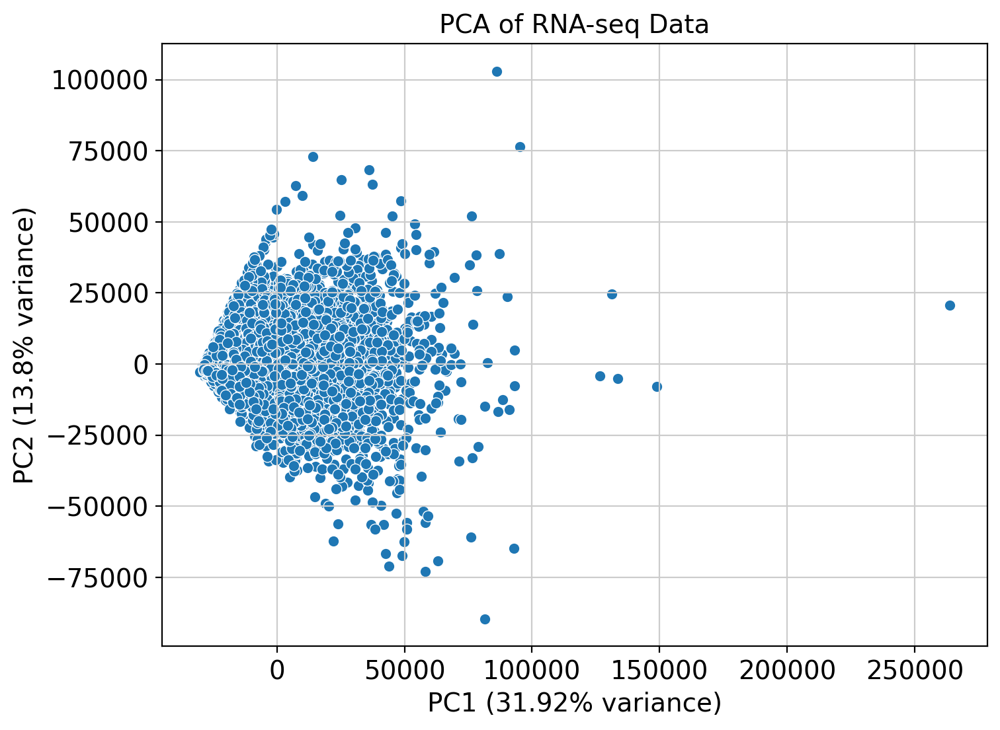

In [14]:
from sklearn.decomposition import PCA
tcelldf = tcelldf.iloc[:,2:]
pca = PCA(n_components=2)
pca_result = pca.fit_transform(tcelldf.T)  # Transpose: samples as rows, genes as columns

pca_df = pd.DataFrame(pca_result, columns=["PC1", "PC2"], index=tcelldf.columns)

# Scatter plot
plt.figure(figsize=(8, 6))
sns.scatterplot(x="PC1", y="PC2", data=pca_df)
plt.xlabel("PC1 ({}% variance)".format(round(pca.explained_variance_ratio_[0] * 100, 2)))
plt.ylabel("PC2 ({}% variance)".format(round(pca.explained_variance_ratio_[1] * 100, 2)))
plt.title("PCA of RNA-seq Data")
plt.show()


In [15]:
tcelladata = ad.AnnData(X=tcelldf.transpose())
tcelladata.var.index = gene_symbols
tcelladata.obs['samples'] = tcelldf.columns
tcelladata.layers["raw_count"] = tcelldf.transpose()

print(tcelladata.obs.columns)


Index(['samples'], dtype='object')


/home/pyxie/miniconda3/envs/custom_jupyter_env/lib/python3.12/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


/local/scratch/pyxie/slrmtmp.47760608/ipykernel_32857/2490881200.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  tcelladata.obs['no_genes'] = (tcelladata.X > 0).sum(axis=1)
/home/pyxie/miniconda3/envs/custom_jupyter_env/lib/python3.12/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/pyxie/miniconda3/envs/custom_jupyter_env/lib/python3.12/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/pyxie/miniconda3/envs/custom_jupyter_env/lib/python3.12/site-packages/scanpy/preprocessing/_qc.py:141: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[obs_metrics.columns] = obs_metrics
/home/pyxie/miniconda3/envs/cu

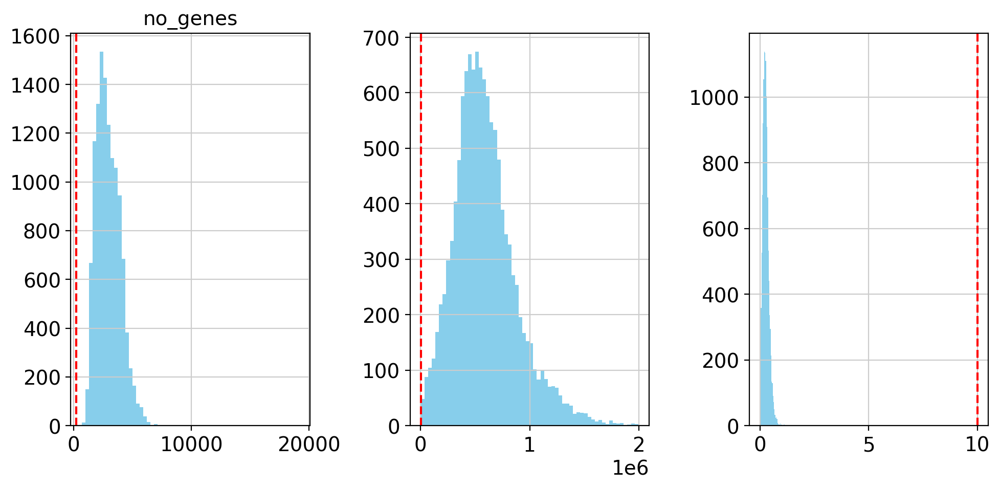

<Figure size 400x400 with 0 Axes>

<Figure size 400x400 with 0 Axes>

In [17]:
tcelladata.obs['no_genes'] = (tcelladata.X > 0).sum(axis=1)
tcelladata.obs['total_counts'] = tcelladata.X.sum(axis=1)
tcelladata.var["percent_mito"] = tcelladata.var.index.str.startswith(("MT"))
# Filter out cells with low numbers of genes or high mitochondrial gene expression
tcelladata = tcelladata[tcelladata.obs['no_genes'] > 200,]
tcelladata  = tcelladata[tcelladata.obs['total_counts']  > 1000]
tcelladata  = tcelladata[tcelladata.obs['total_counts']  < 2e6]
sc.pp.calculate_qc_metrics(tcelladata, qc_vars=["percent_mito"], inplace=True)
tcelladata  = tcelladata[tcelladata.obs['pct_counts_percent_mito']  < 2]
# Filter out genes that are expressed in very few cells
sc.pp.filter_genes(tcelladata, min_counts=3)
min_genes = 200
min_counts = 1000
max_counts = 2e6
max_mito = 10
fig, axes = plt.subplots(1, 3, figsize=(10, 5))
tcelladata.obs['no_genes'].hist(bins=60, ax=axes[0], color='skyblue')
axes[0].axvline(min_genes, color='red', linestyle='dashed')
tcelladata.obs['total_counts'].hist(bins=60, ax=axes[1], color='skyblue')
axes[1].axvline(min_counts, color='red', linestyle='dashed')
tcelladata.obs['pct_counts_percent_mito'].hist(bins=60, ax=axes[2], color='skyblue')
axes[2].axvline(max_mito, color='red', linestyle='dashed')
for ax, metric in zip(axes, ['no_genes', 'total_counts', 'pct_counts_percent_mito']):
    ax.set_title(metric)
    plt.tight_layout()
    plt.show()

In [18]:
tcelladata.var_names_make_unique()
print(tcelladata.obs.columns)
tcelladata

Index(['samples', 'no_genes', 'total_counts', 'n_genes_by_counts',
       'log1p_n_genes_by_counts', 'log1p_total_counts',
       'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes',
       'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes',
       'total_counts_percent_mito', 'log1p_total_counts_percent_mito',
       'pct_counts_percent_mito'],
      dtype='object')


AnnData object with n_obs × n_vars = 12320 × 22886
    obs: 'samples', 'no_genes', 'total_counts', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_percent_mito', 'log1p_total_counts_percent_mito', 'pct_counts_percent_mito'
    var: 'percent_mito', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts'
    layers: 'raw_count'

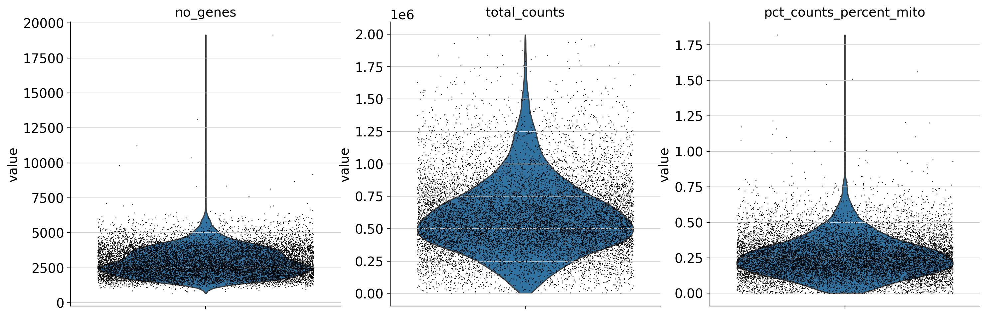

In [19]:
sc.pl.violin(
    tcelladata,
    ["no_genes", "total_counts","pct_counts_percent_mito"],
    jitter=0.4,
    multi_panel=True,
)

In [20]:
sc.pp.normalize_total(tcelladata) # counts per million normalizes for the sequencing depth, natural log normalization is used to adjust the data distribution to be semi-normal
# Sum expression counts for each cell (column-wise sum)
cell_sums = np.array(tcelladata.X.sum(axis=1)).flatten()

print(cell_sums[:20])
sc.pp.log1p(tcelladata)
tcelladata.raw = tcelladata


[555571.5 555571.5 555571.5 555571.5 555571.5 555571.5 555571.5 555571.5
 555571.5 555571.5 555571.5 555571.5 555571.5 555571.5 555571.5 555571.5
 555571.5 555571.5 555571.5 555571.5]


In [21]:
# identify variable genes
sc.pp.highly_variable_genes(tcelladata)
tcelladata

tcelladata.var.loc[tcelladata.var.highly_variable].sort_values("dispersions", ascending=False)
tcelladata.var.rename(columns={'features': 'gene_symbols'}, inplace=True)



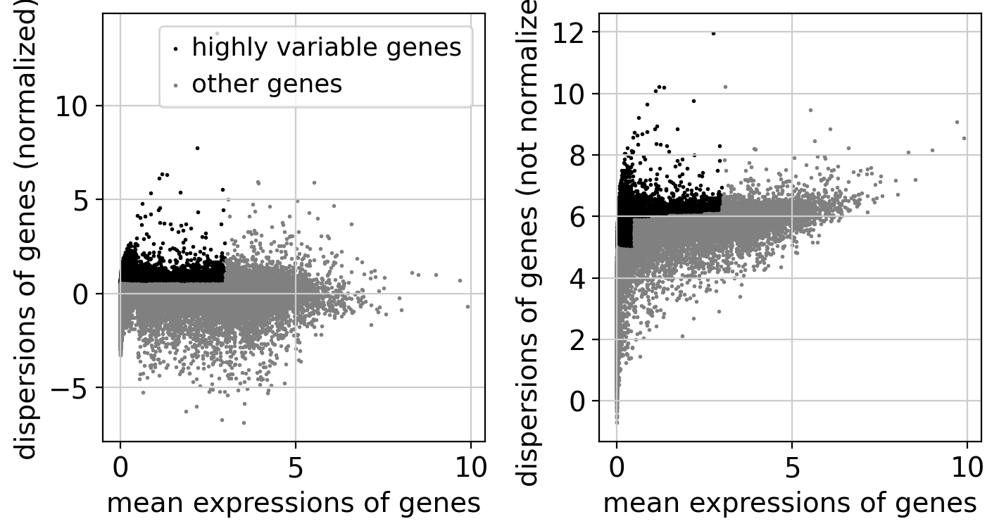

In [22]:
# plot variablility distribution
sc.pl.highly_variable_genes(tcelladata)

In [23]:
sc.pp.scale(tcelladata, max_value=10)

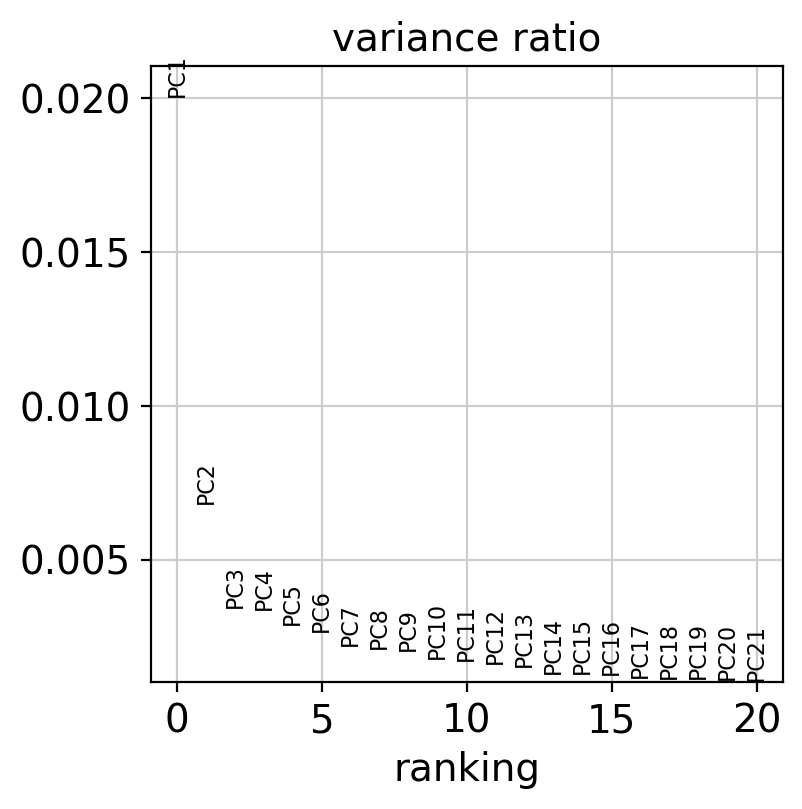

In [24]:
# PCA, default subsets to highly variable features
sc.tl.pca(tcelladata)

# A visualization that is useful for determining how many PCs to include
sc.pl.pca_variance_ratio(tcelladata, n_pcs=20)

In [25]:
# print(tcelldf.index)
print(tcelladata.var.index)
print("CD3D" in tcelladata.var.index)  # Should return True if CD4 is present

tcelladata

Index(['A1BG', 'NAT2', 'ADA', 'CDH2', 'AKT3', 'GAGE12F', 'ZBTB11-AS1', 'MED6',
       'NR2E3', 'NAALAD2',
       ...
       'HNRNPDL', 'DMTF1', 'PPP4R1', 'CDH1', 'SLC12A6', 'PTBP3', 'KCNE2',
       'DGCR2', 'CASP8AP2', 'SCO2'],
      dtype='object', length=22886)
True


AnnData object with n_obs × n_vars = 12320 × 22886
    obs: 'samples', 'no_genes', 'total_counts', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_percent_mito', 'log1p_total_counts_percent_mito', 'pct_counts_percent_mito'
    var: 'percent_mito', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'raw_count'

/home/pyxie/miniconda3/envs/custom_jupyter_env/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/local/scratch/pyxie/slrmtmp.47760608/ipykernel_32857/2597324012.py:3: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(tcelladata, resolution=0.4)  # Adjust resolution for more or fewer clusters


Index(['samples', 'no_genes', 'total_counts', 'n_genes_by_counts',
       'log1p_n_genes_by_counts', 'log1p_total_counts',
       'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes',
       'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes',
       'total_counts_percent_mito', 'log1p_total_counts_percent_mito',
       'pct_counts_percent_mito', 'leiden'],
      dtype='object')


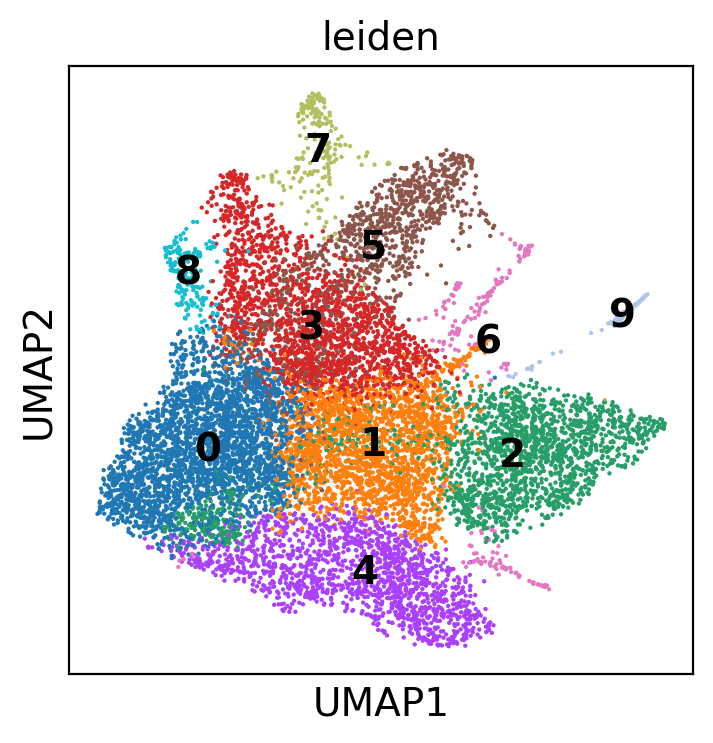

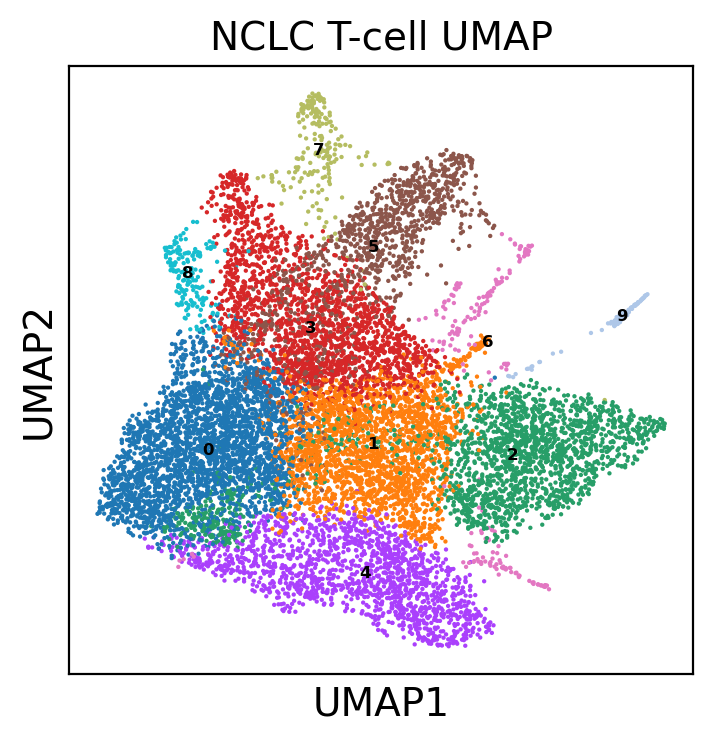

In [26]:
sc.pp.neighbors(tcelladata, n_pcs=15)
# Perform Leiden clustering
sc.tl.leiden(tcelladata, resolution=0.4)  # Adjust resolution for more or fewer clusters
sc.tl.umap(tcelladata)
# plot UMAP
print(tcelladata.obs.columns)  # Ensure 'batch' exists

fig = sc.pl.umap(tcelladata, color=['leiden'], legend_loc="on data")
sc.pl.umap(tcelladata, color="leiden", title="NCLC T-cell UMAP",
           legend_fontsize=6, legend_loc="on data")


In [56]:
# label clusters based on the metadata
print(metadata_df.index)
filtered_metadata = metadata_df[metadata_df.index.isin(tcelladata.obs_names)]

# Ensure the number of cells matches
print(f"Filtered metadata: {filtered_metadata.shape[0]} cells")
print(f"tcelladata: {tcelladata.shape[0]} cells")

# Set Cell_ID as index in metadata for easy merging
# filtered_metadata = filtered_metadata.set_index("cellID")

# Assign clusters to tcelladata.obs
tcelladata.obs["meta_cluster"] = filtered_metadata.loc[tcelladata.obs_names, "Meta_Cluster"].values

# Assign clusters to tcelladata.obs
tcelladata.obs["sample_location"] = filtered_metadata.loc[tcelladata.obs_names, "Loc"].values

# Assign clusters to tcelladata.obs
tcelladata.obs["Patient_no"] = filtered_metadata.loc[tcelladata.obs_names, "Patient"].values

# Verify assignment
print(tcelladata.obs["meta_cluster"].head())

print(tcelladata.obs["meta_cluster"].value_counts())

print(tcelladata.obs["sample_location"].head())

print(tcelladata.obs["sample_location"].value_counts())

print(tcelladata.obs["Patient_no"].head())

print(tcelladata.obs["Patient_no"].value_counts())

Index(['NTH-86-0617', 'NTH69-0619', 'NTH19-0913', 'NTH21-0913', 'NTH25-0913',
       'NTH37-0913', 'NTH51-0913', 'NTH69-0913', 'NTH77-0913', 'NTH87-0913',
       ...
       'TTC12-0617', 'TTC183-0617', 'TTC23-0617', 'TTC33-0617', 'TTC38-0617',
       'TTC65-0617', 'TTC139-1011', 'TTC179-20171120', 'TTC123-1202',
       'TTS-22-0617'],
      dtype='object', name=0, length=12346)
Filtered metadata: 12320 cells
tcelladata: 12320 cells
NTH10-0616A      CD4_C4-CD69
NTH11-0616A    other.diverse
NTH15-0616A       DN.diverse
NTH17-0616A      CD4_C6-GZMA
NTH2-0616A       CD4_C3-GNLY
Name: meta_cluster, dtype: object
meta_cluster
DN.diverse        1616
CD8_C3-CX3CR1     1192
CD4_C4-CD69       1080
other.diverse     1016
CD4_C9-CTLA4       936
CD8_C5-ZNF683      828
CD8_C4-GZMK        674
CD4_C6-GZMA        668
CD4_C2-ANXA1       665
filtered           571
CD4_C1-CCR7        531
CD8_C6-LAYN        493
CD4_C3-GNLY        430
CD4_C8-FOXP3       426
CD4_C7-CXCL13      342
CD8_C1-LEF1        303
CD8_

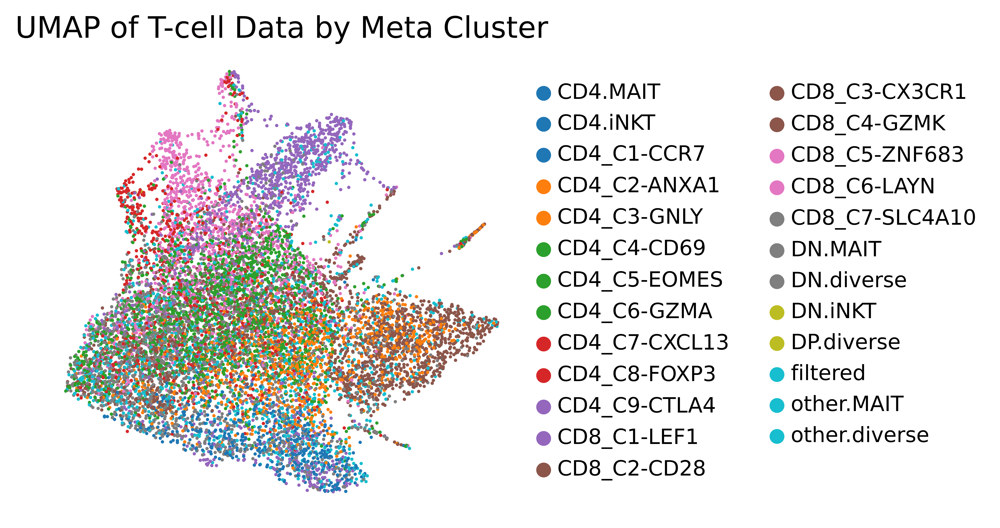

In [135]:
# Plot UMAP colored by meta_cluster
sc.pl.umap(tcelladata, color="meta_cluster", title="UMAP of T-cell Data by Meta Cluster",
           legend_fontsize=10, palette="tab10", frameon=False, save = "NSCLC_UMAP_plot.png")

# plt.gcf().savefig('/labs/delitto/peter/pan_cancer_tcell_atlas_raw_data/figures/umap_cell_type_highres.png', dpi=600)

/home/pyxie/miniconda3/envs/custom_jupyter_env/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/pyxie/miniconda3/envs/custom_jupyter_env/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/pyxie/miniconda3/envs/custom_jupyter_env/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/pyxie/miniconda3/envs/custom_jupyter_env/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/pyxie/miniconda3/envs/custom_jupyter_env/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:455: Runt

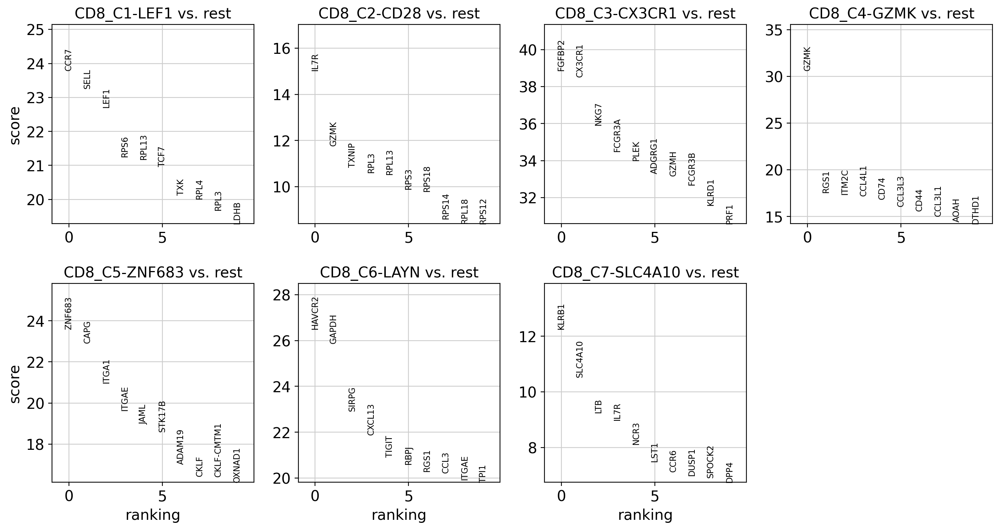

In [58]:
tcelladata_cd8 = tcelladata[tcelladata.obs["meta_cluster"].isin(["CD8_C1-LEF1","CD8_C2-CD28", "CD8_C3-CX3CR1","CD8_C4-GZMK","CD8_C5-ZNF683","CD8_C6-LAYN","CD8_C7-SLC4A10"])].copy() 

sc.tl.rank_genes_groups(tcelladata_cd8, groupby="meta_cluster", method="wilcoxon")
sc.pl.rank_genes_groups(tcelladata_cd8, n_genes=10, sharey=False)

In [59]:
groups = tcelladata_cd8.uns["rank_genes_groups"]["names"].dtype.names 
top_genes_df_1 = sc.get.rank_genes_groups_df(tcelladata_cd8, group = groups[0]).head(10)
top_genes_df_2 = sc.get.rank_genes_groups_df(tcelladata_cd8, group = groups[1]).head(10)
top_genes_df_3 = sc.get.rank_genes_groups_df(tcelladata_cd8, group = groups[2]).head(10)
top_genes_df_4 = sc.get.rank_genes_groups_df(tcelladata_cd8, group = groups[3]).head(10)
top_genes_df_5 = sc.get.rank_genes_groups_df(tcelladata_cd8, group = groups[4]).head(10)
top_genes_df_6 = sc.get.rank_genes_groups_df(tcelladata_cd8, group = groups[5]).head(10)
top_genes_df_7 = sc.get.rank_genes_groups_df(tcelladata_cd8, group = groups[6]).head(10)
# # Combine into one DataFrame
df_all = pd.concat([top_genes_df_1, top_genes_df_2, top_genes_df_3, top_genes_df_4, top_genes_df_5, top_genes_df_6, top_genes_df_7], keys=groups)
print(df_all.head())
print(df_all.shape)


               names     scores  logfoldchanges          pvals      pvals_adj
CD8_C1-LEF1 0   CCR7  23.790741             NaN  4.164594e-125  1.906218e-121
            1   SELL  23.265179             NaN  9.987910e-120  3.809722e-116
            2   LEF1  22.708618             NaN  3.682325e-114  1.053421e-110
            3   RPS6  21.252584             NaN  3.120104e-100   5.100479e-97
            4  RPL13  21.176622             NaN   1.568839e-99   2.393630e-96
(70, 5)


CD8_C1-LEF1  0     CCR7
             1     SELL
             2     LEF1
             3     RPS6
             4    RPL13
             5     TCF7
             6      TXK
             7     RPL4
             8     RPL3
             9     LDHB
Name: names, dtype: object


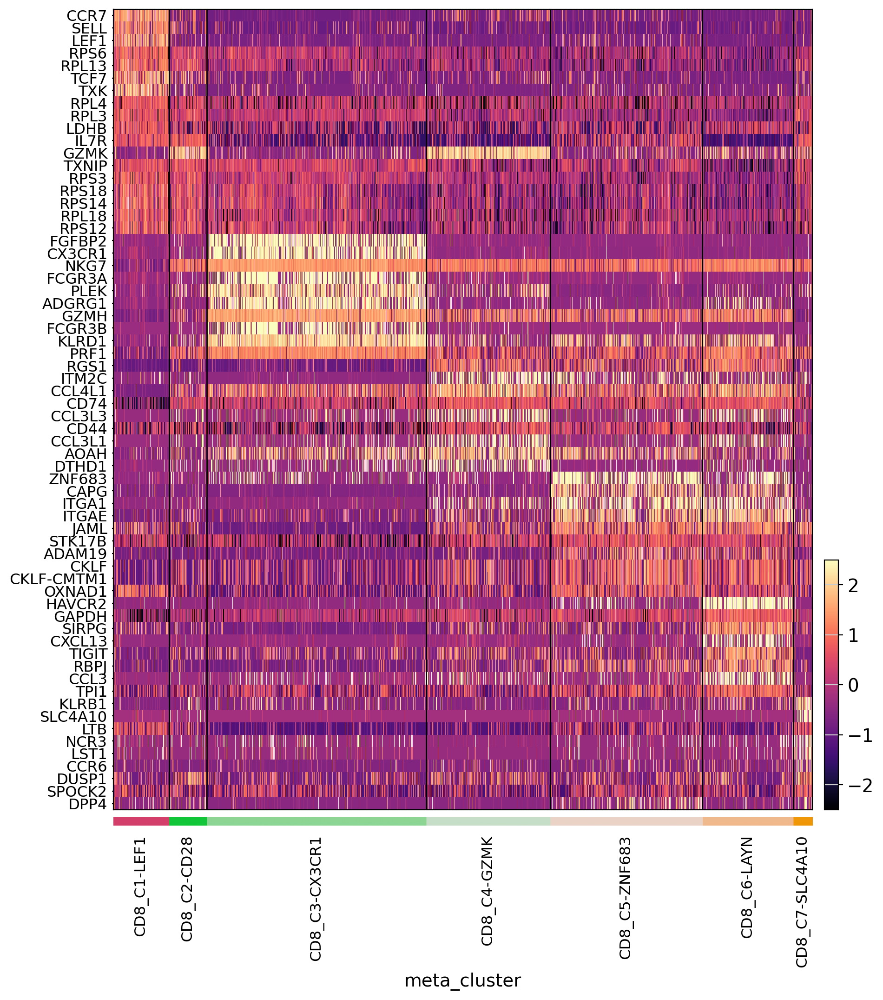

In [60]:
# Extract top genes as a list
top_genes_df = pd.DataFrame(df_all, columns=["names", "scores", "logfoldchanges", "pvals", "pvals_adj"])  # Adjust columns
top_genes_list = top_genes_df["names"]  # Convert column to a list
print(top_genes_list[:10])  # Verify the output
df_unique = top_genes_list.drop_duplicates()

sc.pl.heatmap(
    tcelladata_cd8, 
    var_names=df_unique,   # List of top marker genes
    groupby="meta_cluster", # Group by cancer types
    cmap="magma",        # Change color scale if needed
    swap_axes=True,        # Display genes on Y-axis
    show=True,
    show_gene_labels = True,
    vmin=-2.5, vmax=2.5,  # Adjust for better contrast
)


In [61]:
batch_mapping = {
   "PTC": "Blood",
   "NTC": "Adjacent",
   "TTC": "Tumor",
   "PTH": "Blood",
   "NTH": "Adjacent",
   "TTH": "Tumor",
   "PTR": "Blood",
   "NTR": "Adjacent",
   "TTR": "Tumor",
   "PTY": "Blood",
   "NTY": "Adjacent",
   "TTY": "Tumor"   
}
batch_mapping2 = {
   "PTC": "Blood",
   "NTC": "Solid",
   "TTC": "Solid",
   "PTH": "Blood",
   "NTH": "Solid",
   "TTH": "Solid",
   "PTR": "Blood",
   "NTR": "Solid",
   "TTR": "Solid",
   "PTY": "Blood",
   "NTY": "Solid",
   "TTY": "Solid"   
}

# batch_mapping = {
#    "PTC": "Blood CD8+",
#    "NTC": "Adjacent CD8+",
#    "TTC": "Tumor CD8+",
#    "PTH": "CD4+",
#    "NTH": "CD4+",
#    "TTH": "CD4+",
#    "PTR": "CD4+",
#    "NTR": "CD4+",
#    "TTR": "CD4+",
#    "PTY": "CD4+",
#    "NTY": "CD4+",
#    "TTY": "CD4+" 
# }

# Create a new batch column by mapping sample prefixes
tcelladata_cd8.obs["batch"] = tcelladata_cd8.obs["samples"].str[:3].map(batch_mapping)

# Create a new batch column by mapping sample prefixes
tcelladata_cd8.obs["mechanics"] = tcelladata_cd8.obs["samples"].str[:3].map(batch_mapping2)

In [136]:
sc.tl.rank_genes_groups(tcelladata_cd8, groupby="batch", method="wilcoxon")
sc.pl.rank_genes_groups(tcelladata_cd8, n_genes=10, sharey=False)

/home/pyxie/miniconda3/envs/custom_jupyter_env/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/pyxie/miniconda3/envs/custom_jupyter_env/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/pyxie/miniconda3/envs/custom_jupyter_env/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(


In [143]:
groups = tcelladata_cd8.uns["rank_genes_groups"]["names"].dtype.names 
top_genes_df_1 = sc.get.rank_genes_groups_df(tcelladata_cd8, group = groups[0]).head(200)
top_genes_df_2 = sc.get.rank_genes_groups_df(tcelladata_cd8, group = groups[1]).head(200)
top_genes_df_3 = sc.get.rank_genes_groups_df(tcelladata_cd8, group = groups[2]).head(200)
# # Combine into one DataFrame
df_all = pd.concat([top_genes_df_1, top_genes_df_2, top_genes_df_3], keys=groups)
print(df_all.head())
print(df_all.shape)


              names     scores  logfoldchanges         pvals     pvals_adj
Adjacent 0  TSC22D3  11.962056             NaN  5.615417e-33  1.285144e-28
         1    KLRD1  11.604895        1.241717  3.891661e-31  2.968818e-27
         2   FCGR3A   9.957539        2.177424  2.337792e-23  4.458559e-20
         3   FCGR3B   9.606834        2.264594  7.481373e-22  1.222991e-18
         4     GZMH   9.470630        0.959735  2.781627e-21  4.244022e-18
(600, 5)


In [150]:
# Extract top genes as a list
top_genes_df = pd.DataFrame(df_all, columns=["names", "scores", "logfoldchanges", "pvals", "pvals_adj"])  # Adjust columns
top_genes_list = top_genes_df["names"]  # Convert column to a list
print(top_genes_list[:10])  # Verify the output
df_unique = top_genes_list.drop_duplicates()
print(df_unique)
geo_gene_list_mechanotransduction = [
    "ABHD12", "ACTA1", "ADGRV1", "ANGPT2", "ANKRD1", "ANKRD23", "ANO3", "AQP1", "ASIC2", "ASIC3",
    "ATAT1", "ATOH7", "ATP1A2", "ATP8A2", "ATR", "BACE1", "BAD", "BAG3", "BAK1", "BCL10",
    "BDKRB1", "BGLAP", "BMP6", "BNIP3", "BTG2", "CALB1", "CAPN2", "CASP1", "CASP2", "CASP5",
    "CASP8", "CASP8AP2", "CAV3", "CD40", "CDH2", "CHEK1", "CHI3L1", "CHRNA10", "CHRNA9", "CITED2",
    "CLCN6", "CNN2", "CNTNAP2", "COL11A1", "COL1A1", "COL6A1", "CRADD", "CSRP3", "CTNNB1", "CXCL10",
    "CXCL12", "CXCR4", "DAG1", "DCANP1", "DDR2", "DMD", "DRD2", "EDN1", "EGFR", "ENG",
    "ETV1", "F11R", "FADD", "FAS", "FGF2", "FOS", "FOSB", "FOSL1", "FYN", "GADD45A",
    "GAP43", "GATA4", "GCLC", "GDF5", "GPI", "GSN", "HABP4", "HPN", "HTR2A", "HTT",
    "IGF1R", "IGFBP2", "IHH", "IL13", "IL1B", "IL33", "IRF1", "ITGA2", "ITGAM", "ITGB3",
    "JUP", "KCNA1", "KCNA5", "KCNC1", "KCNJ2", "KCNK2", "KCNK4", "KCNQ1", "KCNQ3", "KIAA0319",
    "KIT", "KRT5", "LARGE1", "LHFPL5", "LRP11", "LTBR", "MAG", "MAP1B", "MAP2K4", "MAP3K1",
    "MAP3K14", "MAP3K2", "MAPK14", "MAPK3", "MAPK8", "MBD2", "MDK", "MEIS2", "MKKS", "MMP14",
    "MMP2", "MPO", "MYD88", "NEUROG1", "NFKB1", "NFKBIA", "NPPA", "NRXN1", "NRXN2",
    "NTRK1", "P2RX3", "P2RX7", "P2RY1", "PDE2A", "PDZD7", "PHF24", "PIEZO1", "PIEZO2", "PIK3CA",
    "PJVK", "PKD1", "PKD1L1", "PKD1L2", "PKD1L3", "PKD2", "PKD2L1", "PKD2L2", "PKDREJ", "PLEC",
    "POSTN", "PPL", "PSPH", "PTCH1", "PTGER4", "PTGS2", "PTK2", "PTK2B", "PTN", "RAF1",
    "RELA", "RETN", "RPS6KB1", "RYR2", "SCEL", "SCN11A", "SCN1A", "SCN9A", "SCX", "SERPINE2",
    "SHANK3", "SLC1A3", "SLC26A5", "SLC2A1", "SLC38A2", "SLC8A1", "SLC9A1", "SLITRK6", "SOST", "SOX9",
    "SRC", "STAT1", "STRA6", "STRBP", "STRC", "SUN1", "TACR1", "TCAP", "TGFB1", "THBS1",
    "TIFAB", "TLR3", "TLR4", "TLR5", "TLR7", "TLR8", "TMC1", "TMC2", "TMEM120A", "TMEM150C",
    "TMEM87A", "TNC", "TNF", "TNFRSF10A", "TNFRSF10B", "TNFRSF11A", "TNFRSF1A", "TNFRSF8", "TNFSF14", "TRPA1",
    "TRPV4", "TTN", "TUBA1A", "TXNIP", "UCN", "USP53", "WHRN", "WNT11", "XPA", "XPC", "VCAM1"]

exhaustion_genes = [
    "PDCD1", "LAG3", "TIGIT", "CTLA4", "HAVCR2", "TOX", 
]
cytokine_genes = ['IL2', 'GZMA', 'GNLY', 'PRF1', 'GZMB', 'GZMK', 'IFNG','TNF', 'NKG7']

mech_genes = [
    "PIEZO1", "ITGA", "OSR2", "SCD4", "VCAM1", "ITGAL", "ITGB2", "ITGAM", "ITGB1", "CDC42", "RAC1", "TLN1", "TLN2", "VCL", "PXN", "PTK2", "YAP1", 
    "WWTR1", "MST1", "TRPV4", "LMNA", "NES", "MYH9"
]
mech_genes_in_data = [x for x in mech_genes if x in tcelladata.var_names]
print(len(mech_genes_in_data))
# Find overlapping genes
overlapping_genes = set(df_unique).intersection(set(geo_gene_list_mechanotransduction))
overlapping_genes = list(overlapping_genes)
print("Overlapping Genes:", overlapping_genes)
desired_order = ["Blood", "Adjacent", "Tumor"]  # Replace with your batch categories in the desired order
tcelladata_cd8.obs["batch"] = pd.Categorical(
    tcelladata_cd8.obs["batch"], categories=desired_order, ordered=True
)

sc.pl.heatmap(
    tcelladata_cd8, 
    var_names=mech_genes_in_data+exhaustion_genes,   # List of top marker genes
    groupby="batch", # Group by cancer types
    cmap="magma",        # Change color scale if needed
    swap_axes=True,        # Display genes on Y-axis
    show=True,
    show_gene_labels = True,
    vmin=-2.5, vmax=2.5,  # Adjust for better contrast
    save = 'NSCLC_tumor_location_Heatmap_plot_mechanotransduction_and_exh_genes.png'
)

Adjacent  0    TSC22D3
          1      KLRD1
          2     FCGR3A
          3     FCGR3B
          4       GZMH
          5      ANXA1
          6       PRF1
          7       HCG4
          8     ADGRG1
          9       CCL4
Name: names, dtype: object
Adjacent  0       TSC22D3
          1         KLRD1
          2        FCGR3A
          3        FCGR3B
          4          GZMH
                   ...   
Tumor     195      TTC39C
          196    HLA-DPA1
          197       PARP9
          198       DRAP1
          199    CALCOCO2
Name: names, Length: 557, dtype: object
21
Overlapping Genes: ['TGFB1', 'ITGAM', 'CXCR4', 'PTGER4', 'STAT1', 'TXNIP', 'FYN', 'FOS', 'CITED2', 'FOSB', 'CASP8']


/home/pyxie/miniconda3/envs/custom_jupyter_env/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/pyxie/miniconda3/envs/custom_jupyter_env/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(


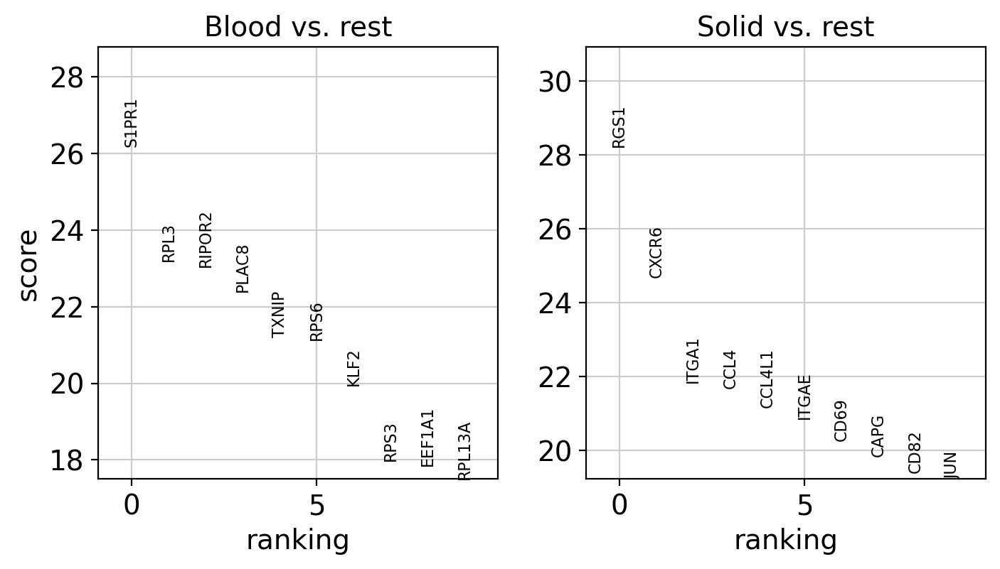

In [65]:
sc.tl.rank_genes_groups(tcelladata_cd8, groupby="mechanics", method="wilcoxon")
sc.pl.rank_genes_groups(tcelladata_cd8, n_genes=10, sharey=False)

In [66]:
groups = tcelladata_cd8.uns["rank_genes_groups"]["names"].dtype.names 
top_genes_df_1 = sc.get.rank_genes_groups_df(tcelladata_cd8, group = groups[0]).head(25)
top_genes_df_2 = sc.get.rank_genes_groups_df(tcelladata_cd8, group = groups[1]).head(25)
# # Combine into one DataFrame
df_all = pd.concat([top_genes_df_1, top_genes_df_2], keys=groups)
print(df_all.head())
print(df_all.shape)


          names     scores  logfoldchanges          pvals      pvals_adj
Blood 0   S1PR1  26.173136             NaN  5.375553e-151  6.151246e-147
      1    RPL3  23.180210             NaN  7.210957e-119  4.125749e-115
      2  RIPOR2  23.032415             NaN  2.207406e-117  1.010374e-113
      3   PLAC8  22.396534             NaN  4.254125e-111  1.622665e-107
      4   TXNIP  21.207088             NaN  8.214378e-100   2.088825e-96
(50, 5)


Adjacent  0    TSC22D3
          1      KLRD1
          2     FCGR3A
          3     FCGR3B
          4       GZMH
          5      ANXA1
          6       PRF1
          7       HCG4
          8     ADGRG1
          9       CCL4
Name: names, dtype: object
Adjacent  0     TSC22D3
          1       KLRD1
          2      FCGR3A
          3      FCGR3B
          4        GZMH
          5       ANXA1
          6        PRF1
          7        HCG4
          8      ADGRG1
          9        CCL4
          10       CST7
          11     nan-47
          12      S1PR5
          13      PRDM1
          14       NKG7
Blood     0       S1PR1
          1        RPL3
          2      RIPOR2
          3       PLAC8
          4       TXNIP
          5        RPS6
          6        KLF2
          7        RPS3
          8      EEF1A1
          9      RPL13A
          10     CX3CR1
          11     FGFBP2
          12      RPL13
          13       RPL5
          14      RPL34
Tumor     0        RGS1

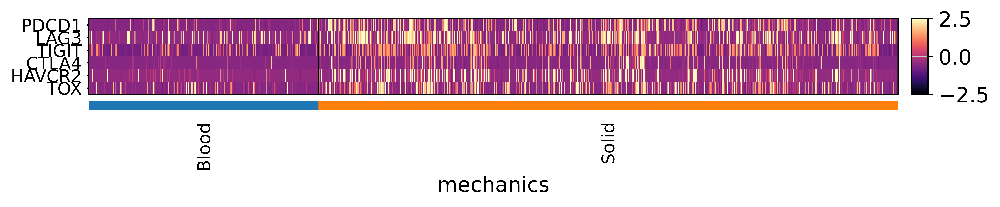

In [142]:
# Extract top genes as a list
top_genes_df = pd.DataFrame(df_all, columns=["names", "scores", "logfoldchanges", "pvals", "pvals_adj"])  # Adjust columns
top_genes_list = top_genes_df["names"]  # Convert column to a list
print(top_genes_list[:10])  # Verify the output
df_unique = top_genes_list.drop_duplicates()
print(df_unique)
geo_gene_list_mechanotransduction = [
    "ABHD12", "ACTA1", "ADGRV1", "ANGPT2", "ANKRD1", "ANKRD23", "ANO3", "AQP1", "ASIC2", "ASIC3",
    "ATAT1", "ATOH7", "ATP1A2", "ATP8A2", "ATR", "BACE1", "BAD", "BAG3", "BAK1", "BCL10",
    "BDKRB1", "BGLAP", "BMP6", "BNIP3", "BTG2", "CALB1", "CAPN2", "CASP1", "CASP2", "CASP5",
    "CASP8", "CASP8AP2", "CAV3", "CD40", "CDH2", "CHEK1", "CHI3L1", "CHRNA10", "CHRNA9", "CITED2",
    "CLCN6", "CNN2", "CNTNAP2", "COL11A1", "COL1A1", "COL6A1", "CRADD", "CSRP3", "CTNNB1", "CXCL10",
    "CXCL12", "CXCR4", "DAG1", "DCANP1", "DDR2", "DMD", "DRD2", "EDN1", "EGFR", "ENG",
    "ETV1", "F11R", "FADD", "FAS", "FGF2", "FOS", "FOSB", "FOSL1", "FYN", "GADD45A",
    "GAP43", "GATA4", "GCLC", "GDF5", "GPI", "GSN", "HABP4", "HPN", "HTR2A", "HTT",
    "IGF1R", "IGFBP2", "IHH", "IL13", "IL1B", "IL33", "IRF1", "ITGA2", "ITGAM", "ITGB3",
    "JUP", "KCNA1", "KCNA5", "KCNC1", "KCNJ2", "KCNK2", "KCNK4", "KCNQ1", "KCNQ3", "KIAA0319",
    "KIT", "KRT5", "LARGE1", "LHFPL5", "LRP11", "LTBR", "MAG", "MAP1B", "MAP2K4", "MAP3K1",
    "MAP3K14", "MAP3K2", "MAPK14", "MAPK3", "MAPK8", "MBD2", "MDK", "MEIS2", "MKKS", "MMP14",
    "MMP2", "MPO", "MTPN", "MYD88", "NEUROG1", "NFKB1", "NFKBIA", "NPPA", "NRXN1", "NRXN2",
    "NTRK1", "P2RX3", "P2RX7", "P2RY1", "PDE2A", "PDZD7", "PHF24", "PIEZO1", "PIEZO2", "PIK3CA",
    "PJVK", "PKD1", "PKD1L1", "PKD1L2", "PKD1L3", "PKD2", "PKD2L1", "PKD2L2", "PKDREJ", "PLEC",
    "POSTN", "PPL", "PSPH", "PTCH1", "PTGER4", "PTGS2", "PTK2", "PTK2B", "PTN", "RAF1",
    "RELA", "RETN", "RPS6KB1", "RYR2", "SCD4","SCEL", "SCN11A", "SCN1A", "SCN9A", "SCX", "SERPINE2",
    "SHANK3", "SLC1A3", "SLC26A5", "SLC2A1", "SLC38A2", "SLC8A1", "SLC9A1", "SLITRK6", "SOST", "SOX9",
    "SRC", "STAT1", "STRA6", "STRBP", "STRC", "SUN1", "TACR1", "TCAP", "TGFB1", "THBS1",
    "TIFAB", "TLR3", "TLR4", "TLR5", "TLR7", "TLR8", "TMC1", "TMC2", "TMEM120A", "TMEM150C",
    "TMEM87A", "TNC", "TNF", "TNFRSF10A", "TNFRSF10B", "TNFRSF11A", "TNFRSF1A", "TNFRSF8", "TNFSF14", "TRPA1",
    "TRPV4", "TTN", "TUBA1A", "TXNIP", "UCN", "USP53", "WHRN", "WNT11", "XPA", "XPC", "VCAM1", "SCD4"
]
exhaustion_genes = [
    "PDCD1", "LAG3", "TIGIT", "CTLA4", "HAVCR2", "TOX"
]

# Find overlapping genes
overlapping_genes = set(df_unique).intersection(set(geo_gene_list_mechanotransduction))
overlapping_genes = list(overlapping_genes)
print("Overlapping Genes:", overlapping_genes)

sc.pl.heatmap(
    tcelladata_cd8, 
    var_names=exhaustion_genes,   # List of top marker genes
    groupby="mechanics", # Group by cancer types
    cmap="magma",        # Change color scale if needed
    swap_axes=True,        # Display genes on Y-axis
    show=True,
    show_gene_labels = True,
    vmin=-2.5, vmax=2.5,  # Adjust for better contrast
    save = 'NSCLC_tumor_location_Heatmap_plot_onlyexhaustion_markers.png'
)

In [152]:
from scipy.stats import kruskal, mannwhitneyu
exhaustion_genes = [
    "PDCD1", "LAG3", "TIGIT", "CTLA4", "HAVCR2", "TOX"
]
# exhaustion_genes = [
#     "PIEZO1", "ITGA", "OSR2", "SCD$", "VCAM1", "ITGAL", "ITGB2", "ITGAM", "ITGB1"
# ]
print(tcelladata_cd8.obs["Patient_no"])
# print(df_expression.isna().sum())  # Count NaNs per column
# print(df_expression.describe())  # Check summary stats

# Extract expression values for exhaustion genes
exhaustion_data = tcelladata_cd8[:, exhaustion_genes].X.toarray()  # Extract gene expression matrix
print(exhaustion_data)
# Create a DataFrame with gene expression values
# Create a DataFrame with expression values and metadata
# Convert expression matrix to DataFrame with genes as columns
df_expression = pd.DataFrame(
    exhaustion_data, columns=exhaustion_genes, index=tcelladata_cd8.obs.index
)

# Merge with metadata
df_expression["Sample_Type"] = tcelladata_cd8.obs["batch"].values  # Ensure 1D array
df_expression["Patient"] = tcelladata_cd8.obs["Patient_no"].values  # Ensure 1D array
print(df_expression)
print(exhaustion_genes)
# Compute mean expression per patient and sample type (Blood, Adjacent, Tumor)
df_mean_expression = df_expression.groupby(["Patient", "Sample_Type"])[exhaustion_genes].agg(["mean"]).reset_index()
print(df_mean_expression)
df_mean_expression_cleaned = df_mean_expression.dropna()
print(df_mean_expression_cleaned)

PTC10-0616A       P0616A
PTC1-0616A        P0616A
PTC11-0616A       P0616A
PTC12-0616A       P0616A
PTC14-0616A       P0616A
                   ...  
TTC58-20171219     P1219
TTC59-20171219     P1219
TTC61-20171219     P1219
TTC63-20171219     P1219
TTC64-20171219     P1219
Name: Patient_no, Length: 3801, dtype: category
Categories (14, object): ['P0616A', 'P0616P', 'P0617', 'P0619', ..., 'P1120', 'P1202', 'P1208', 'P1219']
PDCD1          0
LAG3           0
TIGIT          0
CTLA4          0
HAVCR2         0
TOX            0
Sample_Type    0
Patient        0
dtype: int64
             PDCD1         LAG3        TIGIT        CTLA4       HAVCR2  \
count  3801.000000  3801.000000  3801.000000  3801.000000  3801.000000   
mean      0.086019     0.530119     0.081001    -0.278673     0.200486   
std       1.048335     1.309408     0.990515     0.721635     1.208913   
min      -0.567111    -0.451664    -0.781197    -0.549417    -0.414795   
25%      -0.567111    -0.451664    -0.781197    -0.54

/local/scratch/pyxie/slrmtmp.47760608/ipykernel_32857/1997919064.py:28: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_mean_expression = df_expression.groupby(["Patient", "Sample_Type"])[exhaustion_genes].agg(["mean"]).reset_index()


In [153]:
df_mean_expression_cleaned["Exhaustion_Score"] = df_mean_expression_cleaned[exhaustion_genes].mean(axis=1)


/local/scratch/pyxie/slrmtmp.47760608/ipykernel_32857/4195534013.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_mean_expression_cleaned["Exhaustion_Score"] = df_mean_expression_cleaned[exhaustion_genes].mean(axis=1)


In [154]:
print(df_expression["Patient"].unique())  # Should list patient IDs
print(df_expression["Sample_Type"].unique())  # Should list 'Blood', 'Adjacent', 'Tumor'


['P0616A', 'P0616P', 'P0617', 'P0619', 'P0706', ..., 'P1118', 'P1120', 'P1202', 'P1208', 'P1219']
Length: 14
Categories (14, object): ['P0616A', 'P0616P', 'P0617', 'P0619', ..., 'P1120', 'P1202', 'P1208', 'P1219']
['Blood', 'Tumor', 'Adjacent']
Categories (3, object): ['Blood' < 'Adjacent' < 'Tumor']


/local/scratch/pyxie/slrmtmp.47760608/ipykernel_32857/498518170.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_mean_expression_cleaned["Sample_Type"] = pd.Categorical(


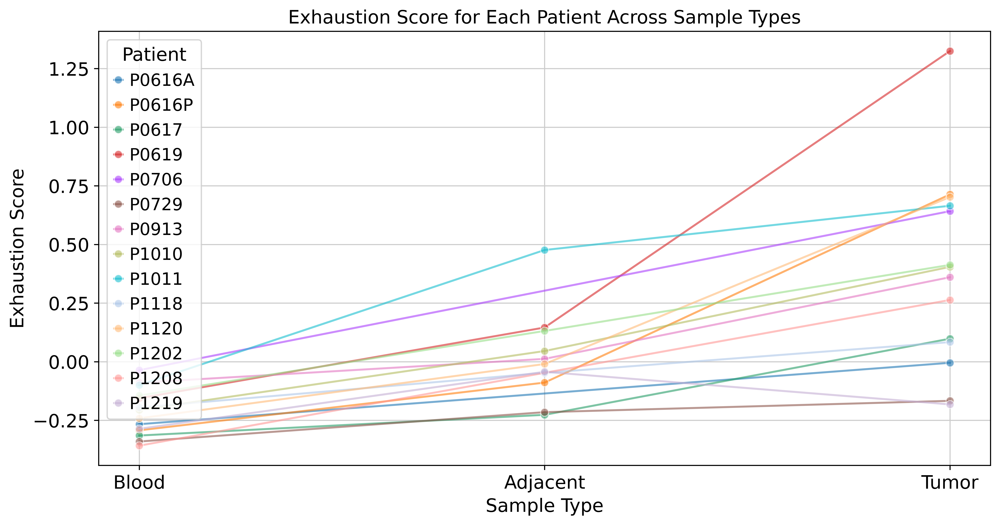

/local/scratch/pyxie/slrmtmp.47760608/ipykernel_32857/498518170.py:46: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Patient", bbox_to_anchor=(1.05, 1), loc="upper left")


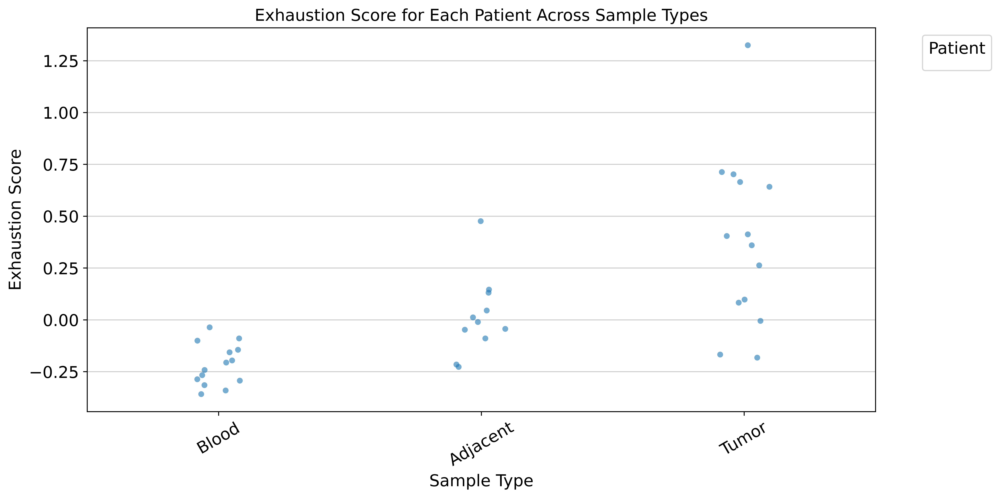

In [156]:
import seaborn as sns
import matplotlib.pyplot as plt

sample_order = ["Blood", "Adjacent", "Tumor"]

# Convert Sample_Type column to categorical type with specific order
df_mean_expression_cleaned["Sample_Type"] = pd.Categorical(
    df_mean_expression_cleaned["Sample_Type"], categories=sample_order, ordered=True
)

# Now plots will automatically respect this order

# Line plot of exhaustion scores for each patient across sample types
plt.figure(figsize=(12, 6), dpi=300)
sns.lineplot(
    data=df_mean_expression_cleaned,
    x="Sample_Type",
    y="Exhaustion_Score",
    hue="Patient",
    marker="o",
    linestyle="-",
    alpha=0.6,
)
plt.xlabel("Sample Type")
plt.ylabel("Exhaustion Score")
plt.title("Exhaustion Score for Each Patient Across Sample Types")
plt.savefig("/home/pyxie/Single_cell_pan_tcell_analysis/figures/patient_exhaustion_data.png", dpi=300, bbox_inches="tight")

# Show the plot
plt.show()

plt.figure(figsize=(12, 6), dpi=300)
sns.stripplot(
    data=df_mean_expression_cleaned,
    x="Sample_Type",
    y="Exhaustion_Score",
    jitter=True,
    alpha=0.6,
    order=sample_order  # Set the x-axis order
)

plt.xlabel("Sample Type")
plt.ylabel("Exhaustion Score")
plt.title("Exhaustion Score for Each Patient Across Sample Types")
plt.xticks(rotation=30)
plt.legend(title="Patient", bbox_to_anchor=(1.05, 1), loc="upper left")

plt.show()



/local/scratch/pyxie/slrmtmp.47760608/ipykernel_32857/2729016231.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(


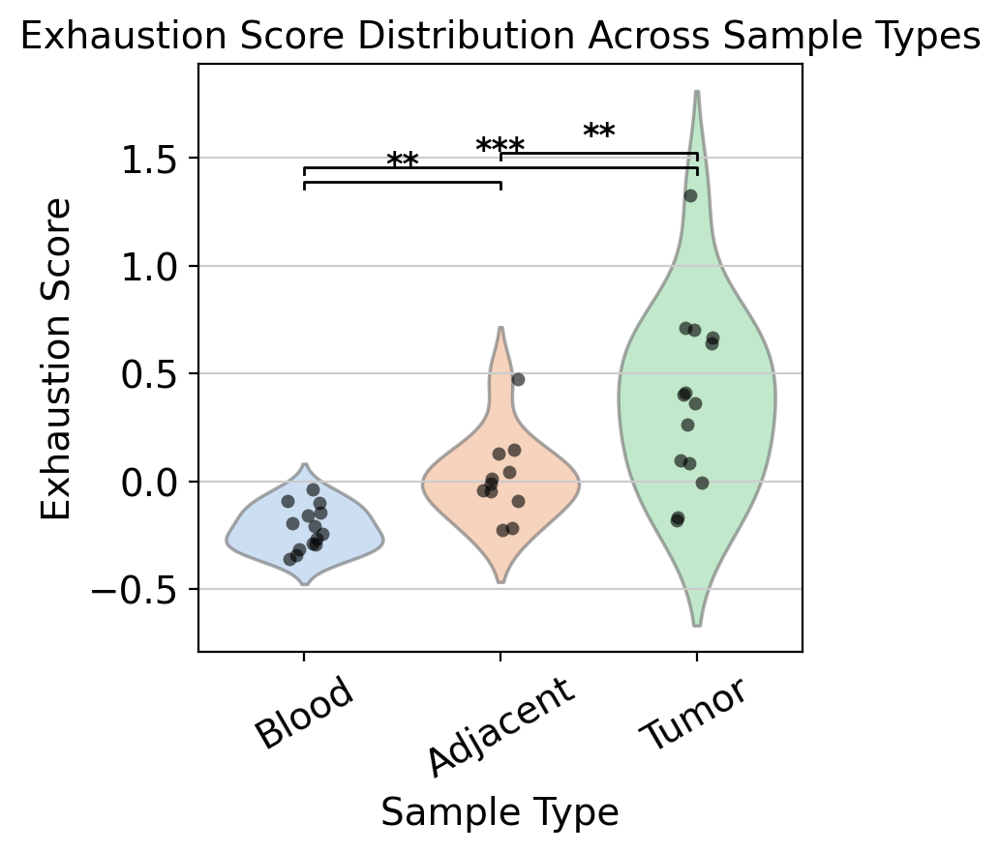

In [129]:
# import statannotations
from scipy.stats import ttest_ind

sns.violinplot(
    data=df_mean_expression_cleaned,
    x="Sample_Type",
    y="Exhaustion_Score",
    order=sample_order,
    inner=None,  # Remove inner lines
    alpha=0.6,
    palette="pastel"
)

# Scatter plot overlaid
sns.stripplot(
    data=df_mean_expression_cleaned,
    x="Sample_Type",
    y="Exhaustion_Score",
    order=sample_order,
    jitter=True,
    alpha=0.6,
    color="black"
)

plt.xlabel("Sample Type")
plt.ylabel("Exhaustion Score")
plt.title("Exhaustion Score Distribution Across Sample Types")

# Pairwise t-tests for significance
p_values = {}
for i in range(len(sample_order)):
    for j in range(i + 1, len(sample_order)):
        group1 = df_mean_expression_cleaned[df_mean_expression_cleaned["Sample_Type"] == sample_order[i]]["Exhaustion_Score"]
        group2 = df_mean_expression_cleaned[df_mean_expression_cleaned["Sample_Type"] == sample_order[j]]["Exhaustion_Score"]
        t_stat, p_val = ttest_ind(group1, group2, equal_var=False)  # Welch’s t-test (handles unequal variance)
        p_values[f"{sample_order[i]} vs {sample_order[j]}"] = p_val

# Function to convert p-values into significance stars
def get_pval_annotation(pval):
    if pval < 0.001:
        return "***"
    elif pval < 0.01:
        return "**"
    elif pval < 0.05:
        return "*"
    else:
        return "ns"  # Not significant

# Manually Add Significance Bars
y_max = df_mean_expression_cleaned["Exhaustion_Score"].max()  # Get highest exhaustion score for plotting
y_step = y_max * 0.05  # Adjust spacing between significance bars

pairs = [("Blood", "Adjacent"), ("Blood", "Tumor"), ("Adjacent", "Tumor")]
x_positions = {name: i for i, name in enumerate(sample_order)}

for i, (group1, group2) in enumerate(pairs):
    p_val = p_values[f"{group1} vs {group2}"]
    sig_label = get_pval_annotation(p_val)

    x1, x2 = x_positions[group1], x_positions[group2]
    y = y_max + (i + 1) * y_step  # Adjust y position for each pair

    plt.plot([x1, x1, x2, x2], [y - y_step / 2, y, y, y - y_step / 2], color="black", linewidth=1)
    plt.text((x1 + x2) / 2, y, sig_label, ha="center", va="bottom", fontsize=12, fontweight="bold")

# Rotate x-axis labels
plt.xticks(rotation=30)
plt.show()

# Display Pairwise T-test Results
p_values_df = pd.DataFrame.from_dict(p_values, orient="index", columns=["p-value"])

df_expression_cleaned.to_csv("/labs/delitto/peter/T_cell_atlases/NSCLC_T_cell/results/exhaustion_scores.csv", index=False)


In [ ]:
print(tcelladata.var.index[:10])  # Show first 10 gene names
print(tcelladata.var.columns)
tcelladata

In [ ]:
# plot common marker genes for pbmc
print(gene_symbols.shape)
print(tcelladata.var.head())  # Check if 'genes' column exists
print(tcelladata.var.index[:10])  # Check current index
print("CD8A" in tcelladata.var.index)
print("CD4" in tcelladata.var.index)
print(tcelladata.obs.columns)
print(tcelladata.var.columns)

genes_to_plot = ['CD3D','CD4','CCR7','FOXP3', 'IL2RA','CD3D','CD8A', 'PIEZO1', 'SELL','COL11A1', 'PDCD1', 'CTLA4', 'CD3G', 'JCHAIN' ]
sc.pl.umap(tcelladata, color=genes_to_plot, use_raw=True,
                sort_order=True, ncols=3)

naive_markers = ['TCF7', 'SELL', 'LEF1', 'CCR7']
inhibitory_receptors = ['LAG3', 'TIGIT', 'PDCD1', 'HAVCR2', 'CTLA4']
cytokine_genes = ['IL2', 'GZMA', 'GNLY', 'PRF1', 'GZMB', 'GZMK', 'IFNG', 'NKG7']
co_stim_molecules = ['CD28', 'TNFRSF14', 'ICOS', 'TNFRSF14', 'ICOS', 'TNFRSF9']
transcription_factors = ['EOMES', 'HOPX', 'TBX21', 'ZEB2', 'ZNF683', 'HIF1A', 'ID2', "TOX"]
tregmarkers = ['IL2RA', 'FOXP3', 'IKZF2']
sc.pl.umap(tcelladata, color=naive_markers, use_raw=True,
                sort_order=True, ncols=3)
sc.pl.umap(tcelladata, color=inhibitory_receptors, use_raw=True,
                sort_order=True, ncols=3)
sc.pl.umap(tcelladata, color=cytokine_genes, use_raw=True,
                sort_order=True, ncols=3)
sc.pl.umap(tcelladata, color=transcription_factors, use_raw=True,
                sort_order=True, ncols=3)
sc.pl.umap(tcelladata, color=tregmarkers, use_raw=True,
                sort_order=True, ncols=3)

In [ ]:
# Ensure raw counts exist
if tcelladata.raw is not None:
    tcelladata.layers["n_counts"] = tcelladata.raw.X.copy()
else:
    raise ValueError("Raw counts are missing. Ensure raw data is stored in tcelladata.raw before using SCVI.")

print(tcelladata.layers.keys())  # Should now include 'n_counts'



In [ ]:
new_cluster_names = ['CD4+ Naive T-cells',
                    'CD8+ Cytotoxic T cells',
                    'CD4+ Memory T-cells',
                    'CD8+ Effector T-cells',
                    'Exhausted CD8+ T-cells', 
                    'CD4+ T-regulatory cells',                    
                    'Cycling/proliferating T-cells',
                    'Activated/memory T-cells',
                    'Unknown']
tcelladata.rename_categories('leiden', new_cluster_names)

sc.pl.umap(tcelladata, color="leiden", title="NCLC T-cell UMAP",
           legend_fontsize=6, legend_loc="on data")

# is there an automatic t-cell labelling software?

In [ ]:
sc.pl.rank_genes_groups_dotplot(
    tcelladata, groupby="leiden", standard_scale="var", n_genes=5
)

#sc.pl.rank_genes_groups_dotplot(
#    tcelladata, groupby="batch", standard_scale="var", n_genes=20
#)

In [ ]:
sc.pl.rank_genes_groups_dotplot(
    tcelladata, groupby="batch", standard_scale="var", n_genes=20
)

In [ ]:

print(tcelladata.obs.columns)
#ample_names = tcelladata.var_na  # This assumes that adata.var_names stores sample names
#sample_names
# batch_mapping = {
#    "PTC": "CD8+ from peripheral blood",
#    "NTC": "CD8+ from adjacent normal lung tissues",
#    "TTC": "CD8+ T-cells from tumor",
#    "PTH": "CD3+, CD4+, CD25- T-cells from peripheral blood",
#    "NTH": "CD3+, CD4+, CD25- T-cells from adjacent normal lung tissues",
#    "TTH": "CD3+, CD4+ and CD25- T cells from tumor",
#    "PTR": "CD3+, CD4+ and CD25high T cells from peripheral blood",
#    "NTR": "CD3+, CD4+ and CD25high T cells from adjacent normal lung tissues",
#    "TTR": "D3+, CD4+ and CD25high T cells from tumor",
#    "PTY": "CD3+, CD4+ and CD25mediate T cells from peripheral blood",
#    "NTY": "CD3+, CD4+ and CD25mediate T cells from adjacent normal lung tissues",
#    "TTY": "CD3+, CD4+ and CD25medate T cells from tumor"   
#}

batch_mapping = {
   "PTC": "Blood",
   "NTC": "Adjacent",
   "TTC": "Tumor",
   "PTH": "Blood",
   "NTH": "Adjacent",
   "TTH": "Tumor",
   "PTR": "Blood",
   "NTR": "Adjacent",
   "TTR": "Tumor",
   "PTY": "Blood",
   "NTY": "Adjacent",
   "TTY": "Tumor"   
}

batch_mapping2 = {
   "PTC": "Blood",
   "NTC": "Solid",
   "TTC": "Solid",
   "PTH": "Blood",
   "NTH": "Solid",
   "TTH": "Solid",
   "PTR": "Blood",
   "NTR": "Solid",
   "TTR": "Solid",
   "PTY": "Blood",
   "NTY": "Solid",
   "TTY": "Solid"   
}

# batch_mapping = {
#    "PTC": "Blood CD8+",
#    "NTC": "Adjacent CD8+",
#    "TTC": "Tumor CD8+",
#    "PTH": "CD4+",
#    "NTH": "CD4+",
#    "TTH": "CD4+",
#    "PTR": "CD4+",
#    "NTR": "CD4+",
#    "TTR": "CD4+",
#    "PTY": "CD4+",
#    "NTY": "CD4+",
#    "TTY": "CD4+" 
# }



# Create a new batch column by mapping sample prefixes
tcelladata.obs["batch"] = tcelladata.obs["samples"].str[:3].map(batch_mapping)

# Create a new batch column by mapping sample prefixes
tcelladata.obs["mechanics"] = tcelladata.obs["samples"].str[:3].map(batch_mapping2)

# Verify the assignment
print(tcelladata.obs[["batch"]].head())

print(tcelladata.obs["batch"].unique())

tcelladata



In [ ]:
with rc_context({"figure.figsize": (10, 15)}):
    sc.pl.violin(tcelladata, ["PIEZO1", "PDCD1","YAP1","OSR2"], groupby="batch")
    

In [ ]:
with rc_context({"figure.figsize": (20, 30)}):
    sc.pl.violin(tcelladata, ["FOXP3"], groupby="batch")
    

In [ ]:
integrin_genes = [x.strip() for x in open('./data/REACTOME_INTEGRIN_CELL_SURFACE_INTERACTIONS.txt')]
print(len(integrin_genes))

exhaustion_genes = [x.strip() for x in open('./data/Exhaustion_gene_set.txt')]
print(len(exhaustion_genes))

mechionchannels_genes = [x.strip() for x in open('./data/pyx_ion_channel_gene_set.txt')]
print(len(mechionchannels_genes))

yap_target_genes = ["DIP2A","EHBP1L1","FGGY-DT","GLYCTK","HMGA2-AS1","LCN8","LINC01547","MARK2P19","NKD2","RN7SL241P","TMEFF2","WDR82"]

activation_genes = ["IL2", "CD25", "IFNG", "GZMB", "TNF"]

px_exhaustion_genes = ['TOX, TIM3, CTLA4','LAG3']

integrin_genes_in_data = [x for x in integrin_genes if x in tcelladata.var_names]
print(len(integrin_genes_in_data))
integrin_gene_scores = 'integrin_gene_scores'
exhaustion_genes_in_data = [x for x in exhaustion_genes if x in tcelladata.var_names]
print(len(exhaustion_genes_in_data))
exhaustion_gene_scores = 'exhaustion_gene_scores'
mechionchannels_genes_in_data = [x for x in mechionchannels_genes if x in tcelladata.var_names]
print(len(mechionchannels_genes_in_data))
mechionchannels_gene_scores = 'mechionchannels_gene_scores'
yap_genes_in_data = [x for x in yap_target_genes if x in tcelladata.var_names]
print(len(yap_genes_in_data))
yap_genes_scores = 'yap_gene_scores'
activation_genes_in_data = [x for x in activation_genes if x in tcelladata.var_names]
print(len(activation_genes_in_data))
activation_genes_scores = 'activation_gene_scores'
px_exhaustion_genes_in_data = [x for x in activation_genes if x in tcelladata.var_names]
print(len(px_exhaustion_genes_in_data))
pxactivation_genes_scores = 'pxexhaustion_gene_scores'

sc.tl.score_genes(tcelladata, gene_list=integrin_genes_in_data, score_name=integrin_gene_scores)
print(tcelladata.obs[integrin_gene_scores])
sc.tl.score_genes(tcelladata, gene_list=exhaustion_genes_in_data, score_name=exhaustion_gene_scores)
print(tcelladata.obs[exhaustion_gene_scores])
sc.tl.score_genes(tcelladata, gene_list=mechionchannels_genes_in_data, score_name=mechionchannels_gene_scores)
print(tcelladata.obs[mechionchannels_gene_scores])
sc.tl.score_genes(tcelladata, gene_list=yap_genes_in_data, score_name=yap_genes_scores)
print(tcelladata.obs[yap_genes_scores])
sc.tl.score_genes(tcelladata, gene_list=activation_genes_in_data, score_name=activation_genes_scores)
print(tcelladata.obs[activation_genes_scores])
sc.tl.score_genes(tcelladata, gene_list=px_exhaustion_genes_in_data, score_name=pxactivation_genes_scores)
print(tcelladata.obs[pxactivation_genes_scores])

In [ ]:
plt.figure(figsize=(10, 6))
for batch in tcelladata.obs['batch'].unique():
    subset = tcelladata.obs[tcelladata.obs['batch'] == batch]
    sns.kdeplot(subset[integrin_gene_scores], label=batch, fill=True, alpha=0.3, linewidth=2)
plt.title("Integrin Gene Score Distribution Across Batches")
plt.xlabel("Integrin Gene Score")
plt.ylabel("Density")
plt.legend(title="Batch")
plt.show()


In [ ]:
plt.figure(figsize=(10, 6))
for batch in tcelladata.obs['batch'].unique():
    subset = tcelladata.obs[tcelladata.obs['batch'] == batch]
    sns.kdeplot(subset[exhaustion_gene_scores], label=batch, fill=True, alpha=0.3, linewidth=2)
plt.title("Exhaustion Gene Score Distribution Across Batches")
plt.xlabel("Exhaustion Gene Score")
plt.ylabel("Density")
plt.legend(title="Batch")
plt.show()

In [ ]:
plt.figure(figsize=(10, 6))
for batch in tcelladata.obs['batch'].unique():
    subset = tcelladata.obs[tcelladata.obs['batch'] == batch]
    sns.kdeplot(subset[mechionchannels_gene_scores], label=batch, fill=True, alpha=0.3, linewidth=2)
plt.title("Mechanosensitive Ion Channel Gene Score Distribution Across Batches")
plt.xlabel("Mechanosensitive ion channel Gene Score")
plt.ylabel("Density")
plt.legend(title="Batch")
plt.show()

In [ ]:
plt.figure(figsize=(10, 6))
for batch in tcelladata.obs['batch'].unique():
    subset = tcelladata.obs[tcelladata.obs['batch'] == batch]
    sns.kdeplot(subset[yap_genes_scores], label=batch, fill=True, alpha=0.3, linewidth=2)
plt.title("Yap target Gene Score Distribution Across Batches")
plt.xlabel("Yap target Gene Score")
plt.ylabel("Density")
plt.legend(title="Batch")
plt.show()

In [ ]:
plt.figure(figsize=(10, 6))
for batch in tcelladata.obs['batch'].unique():
    subset = tcelladata.obs[tcelladata.obs['batch'] == batch]
    sns.kdeplot(subset[activation_genes_scores], label=batch, fill=True, alpha=0.3, linewidth=2)
plt.title("Activation gene Score Distribution Across Batches")
plt.xlabel("activation gene score")
plt.ylabel("Density")
plt.legend(title="Batch")
plt.show()

activation_genes_scores

In [ ]:
## RUN DESEQ ON Blood vs Tumor T-cells
from pydeseq2.dds import DeseqDataSet
from pydeseq2.default_inference import DefaultInference
from pydeseq2.ds import DeseqStats
from pydeseq2.utils import load_example_data
from pydeseq2.preprocessing import deseq2_norm



In [ ]:
tcelladata

In [ ]:
tcelladata.obs
# common_samples = tcelladata.obs.intersection(tcelladata.var.index)
# tcelladata_subset = tcelladata[common_samples].copy()  # Create a new AnnData object
# print("Original metadata shape:", tcelladata.obs.shape)
# print("Subsetted metadata shape:", tcelladata_subset.obs.shape)

print(tcelladata.obs[["mechanics"]])

In [ ]:
tcelladata_sub = tcelladata[tcelladata.obs["mechanics"].isin(["Solid", "Blood"])].copy()

# Extract the count matrix after subsetting
subset_count_matrix = tcelladata_sub.X

print(subset_count_matrix.shape)  # Check the number of cells remaining
print(tcelladata_sub.obs["mechanics"].unique())  # Verify only 'solid' and 'blood' are present



In [ ]:
tcelladata_sub.var.index

In [ ]:
#transpose for correct format into DESeq2
expr_filt_T = tcelladata_sub.layers["raw_count"]
print(expr_filt_T.shape)
expr_filt_T

In [ ]:
inference = DefaultInference(n_cpus=8)
dds = DeseqDataSet(
    counts=expr_filt_T,
    metadata= tcelladata_sub.obs,
    design_factors='mechanics',   #differential expression across mechanical properties
    refit_cooks=True,
    inference=inference,
)

In [ ]:
dds.deseq2()

In [ ]:
dds

In [ ]:
dds.obsm["size_factors"]

In [ ]:
print(dds.varm["LFC"])

In [ ]:
stat_res = DeseqStats(dds, contrast=["mechanics", "Solid", "Blood"], inference=inference)
stat_res.summary()

In [ ]:
resdf = stat_res.results_df.reset_index()
resdf

In [ ]:
resdf['genes'] = tcelladata_sub.var.index

In [ ]:
resdf.loc[resdf.padj<0.05].sort_values("padj")

In [ ]:
resdf['neglog10padj'] = -np.log10(resdf.padj)


In [ ]:
# def Plot_volcano(toplot, xname, yname, nlabel):

#     #setup figure/axes
#     fig,ax=plt.subplots(figsize=(6,6))

#     #plot points
#     sns.scatterplot(data=toplot, x=xname, y=yname)

#     #label to points
#     tolabel = toplot.sort_values(yname, ascending=False).head(nlabel)
#     for k,row in tolabel.iterrows():
#         plt.text(row[xname], row[yname], row['gene'])

#     #axes formatting
#     plt.title("Differential Expression KO/WT")
#     plt.axhline(-np.log10(0.05), linestyle="--", color="black")
#     #plt.xlim(-2,2)
#     sns.despine()
#     plt.show()

In [ ]:
# # Create volcano plot

# Plot_volcano(resdf, 'log2FoldChange', 'neglog10padj', nlabel=10)

# plt.figure(figsize=(8, 6))
# sns.scatterplot(
#     data=resdf, x="log2FoldChange", y="neglog10padj", 
#     alpha=0.7
# )
# tolabel = resdf.sort_values("neglog10padj", ascending=False).head(20)
# # Add threshold lines
# plt.axhline(-np.log10(0.05), linestyle="dashed", color="black")  # FDR threshold
# #plt.axvline(-1.0, linestyle="dashed", color="blue")  # Log2FC threshold (downregulated)
# #plt.axvline(1.0, linestyle="dashed", color="blue")  # Log2FC threshold (upregulated)

# # Label top 10 genes
# #for _, row in top_genes.iterrows():
# #    plt.text(row["log2FC"], row["-log10(adjusted_p)"], row["gene"], fontsize=8, ha="right")

# # Plot Formatting
# plt.xlabel("Log2 Fold Change")
# plt.ylabel("-Log10 Adjusted P-Value")
# plt.title("Volcano Plot of Differentially Expressed Genes")
# plt.legend(title="Significant")
# plt.show()



In [ ]:
resdf

In [ ]:
# Load DESeq2 results (example format)
# Assuming the results DataFrame has columns: 'log2FoldChange', 'padj', and 'gene'
df = resdf  # Replace with your file path

# Define significance thresholds
pval_threshold = 0.05
logfc_threshold = 1.5

# Create a column for significance categorization
df["significance"] = "Not Significant"
df.loc[(df["padj"] < pval_threshold) & (df["log2FoldChange"] > logfc_threshold), "significance"] = "Upregulated"
df.loc[(df["padj"] < pval_threshold) & (df["log2FoldChange"] < -logfc_threshold), "significance"] = "Downregulated"

# Sort by most significant genes (smallest padj)
top_genes = df.nsmallest(20, "padj")  # Get top 20 genes with lowest padj
print(top_genes)
# Plot volcano plot
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=df["log2FoldChange"], 
    y=-np.log10(df["padj"]),
    hue=df["significance"],
    palette={"Upregulated": "red", "Downregulated": "blue", "Not Significant": "gray"},
    alpha=0.7
)

# Label the top genes
for i, row in top_genes.iterrows():
    plt.text(row["log2FoldChange"], -np.log10(row["padj"]), row["genes"])

# Customize the plot
plt.axhline(-np.log10(pval_threshold), linestyle='--', color='black', linewidth=1)  # Horizontal significance threshold
plt.axvline(logfc_threshold, linestyle='--', color='black', linewidth=1)  # Vertical threshold (upregulated)
plt.axvline(-logfc_threshold, linestyle='--', color='black', linewidth=1)  # Vertical threshold (downregulated)

plt.xlabel("Log2 Fold Change")
plt.ylabel("-Log10 Adjusted P-value")
plt.title("Volcano Plot of DESeq2 Results")
plt.legend(title="Significance", loc="upper right")

plt.show()


In [ ]:
tcelladata.var_names

In [ ]:
#subset to significant genes, top20+/- by fold change
tmp = resdf.loc[resdf.padj<0.05]
tmp = tmp.sort_values("log2FoldChange")
tmp = pd.concat([tmp.head(20), tmp.tail(20)])
tmp

In [ ]:
# Extract gene names from subset
top_genes = tmp.genes.tolist()  # Assumes 'gene' is the index
top_genes


In [ ]:
with rc_context({"figure.figsize": (3, 5)}):
    sc.pl.violin(tcelladata, top_genes[0:5], groupby="mechanics")
    
with rc_context({"figure.figsize": (3, 5)}):
    sc.pl.violin(tcelladata, top_genes[6:11], groupby="mechanics")
    
with rc_context({"figure.figsize": (3, 5)}):
    sc.pl.violin(tcelladata, top_genes[20:25], groupby="mechanics")

with rc_context({"figure.figsize": (3, 5)}):
    sc.pl.violin(tcelladata, top_genes[26:31], groupby="mechanics")

In [ ]:
gene_of_interest = "PIEZO1"  # Replace with your gene name
log2fc_value = resdf.loc[resdf["genes"] == gene_of_interest, "log2FoldChange"]
p_value = resdf.loc[resdf["genes"] == gene_of_interest, "padj"]
print('log2FC:',log2fc_value)
print('adjusted p-value:',p_value)


In [ ]:
ax = sc.pl.heatmap(
    tcelladata, groupby="batch", cmap="viridis", dendrogram=True
)